In [1]:
import pandas as pd

df = pd.read_pickle("../data/cens/train_short_audio/acafly/data.pkl.gz")
df

,name,parent,data,sample_rate,seconds,cens,cens_sample_rate,path
0,XC109605,acafly,"[-3.4471168e-07, 3.6376243e-06, -1.5128242e-06...",22050,63.674603,"[[0.315637348478374, 0.3198084396929352, 0.323...",10,data/input/train_short_audio/acafly/XC109605.ogg
1,XC11209,acafly,"[-5.5594504e-05, -0.0015144823, 0.004068937, -...",22050,16.654195,"[[0.322090386851785, 0.3195279306817608, 0.317...",10,data/input/train_short_audio/acafly/XC11209.ogg
2,XC127032,acafly,"[-1.2210558e-05, -1.8426263e-05, -1.7636668e-0...",22050,47.139093,"[[0.24778837052224809, 0.24883469516462636, 0....",10,data/input/train_short_audio/acafly/XC127032.ogg
3,XC129974,acafly,"[3.314617e-08, -5.039625e-08, 9.996619e-08, -7...",22050,14.068073,"[[0.263931420263812, 0.26359621503474817, 0.26...",10,data/input/train_short_audio/acafly/XC129974.ogg
4,XC129981,acafly,"[2.7390568e-09, -1.4222666e-08, 5.1832593e-08,...",22050,40.660726,"[[0.26641179659138686, 0.26771859223998784, 0....",10,data/input/train_short_audio/acafly/XC129981.ogg
...,...,...,...,...,...,...,...,...
127,XC580740,acafly,"[-0.00013234008, 0.0002838285, -0.0014055393, ...",22050,16.381043,"[[0.27739850056526794, 0.27610507439277704, 0....",10,data/input/train_short_audio/acafly/XC580740.ogg
128,XC583856,acafly,"[-1.5661219e-06, -2.7694816e-06, -2.8804427e-0...",22050,73.366032,"[[0.3664005159149588, 0.3590335185552643, 0.35...",10,data/input/train_short_audio/acafly/XC583856.ogg
129,XC594106,acafly,"[5.5103473e-09, -5.6929763e-09, 2.879786e-09, ...",22050,32.653016,"[[0.2881007666644271, 0.2879289774171321, 0.28...",10,data/input/train_short_audio/acafly/XC594106.ogg
130,XC600277,acafly,"[1.1152438e-06, -1.3263835e-06, 1.9514403e-06,...",22050,60.037007,"[[0.2592316843523236, 0.2613025468065321, 0.26...",10,data/input/train_short_audio/acafly/XC600277.ogg


((8,), (597,))

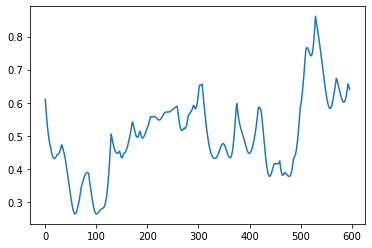

In [2]:
from simple_mp.simple import simple_fast
import matplotlib.pyplot as plt

row = df.iloc[0]
mp, pi = simple_fast(row.cens, row.cens, 50)
plt.plot(mp)
row.shape, mp.shape

In [3]:
motif_idx, pair_idx = mp.argmin(), pi[mp.argmin()]
motif_idx, pair_idx

(100, 58)

In [4]:
from birdclef.utils import compute_offset
import IPython.display as ipd

a, b = compute_offset(motif_idx, 50, row.cens.shape[1], row.data.shape[0])
ipd.Audio(row.data[a:b], rate=row.sample_rate)

In [5]:
motif = row.cens[:, motif_idx: motif_idx+50]
motif.shape

(12, 50)

In [6]:
df.iloc[22]

name                                                         XC163936
parent                                                         acafly
data                [0.0024978924, 0.003665887, 0.0032591738, 0.00...
sample_rate                                                     22050
seconds                                                     11.365034
cens                [[0.30561832425078295, 0.30573632193984807, 0....
cens_sample_rate                                                   10
path                 data/input/train_short_audio/acafly/XC163936.ogg
Name: 22, dtype: object

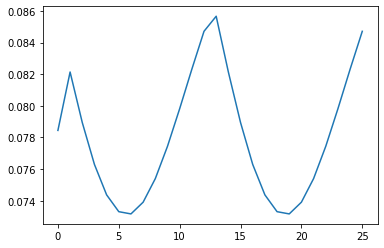

In [7]:
mp, _ = simple_fast(motif, motif, 25)
plt.plot(mp)

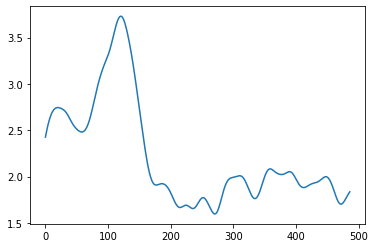

In [8]:
def play_similar(row, motif, window=50):
    mp, pi = simple_fast(row.cens, motif, window)
    plt.plot(mp)
    a, b = compute_offset(mp.argmin(), window, row.cens.shape[1], row.data.shape[0])
    ipd.display(ipd.Audio(row.data[a:b], rate=row.sample_rate))
    ipd.display(ipd.Audio(row.data, rate=row.sample_rate))

play_similar(df.iloc[66], motif)

## compute motif for each row

In [9]:
df.head()

,name,parent,data,sample_rate,seconds,cens,cens_sample_rate,path
0,XC109605,acafly,"[-3.4471168e-07, 3.6376243e-06, -1.5128242e-06...",22050,63.674603,"[[0.315637348478374, 0.3198084396929352, 0.323...",10,data/input/train_short_audio/acafly/XC109605.ogg
1,XC11209,acafly,"[-5.5594504e-05, -0.0015144823, 0.004068937, -...",22050,16.654195,"[[0.322090386851785, 0.3195279306817608, 0.317...",10,data/input/train_short_audio/acafly/XC11209.ogg
2,XC127032,acafly,"[-1.2210558e-05, -1.8426263e-05, -1.7636668e-0...",22050,47.139093,"[[0.24778837052224809, 0.24883469516462636, 0....",10,data/input/train_short_audio/acafly/XC127032.ogg
3,XC129974,acafly,"[3.314617e-08, -5.039625e-08, 9.996619e-08, -7...",22050,14.068073,"[[0.263931420263812, 0.26359621503474817, 0.26...",10,data/input/train_short_audio/acafly/XC129974.ogg
4,XC129981,acafly,"[2.7390568e-09, -1.4222666e-08, 5.1832593e-08,...",22050,40.660726,"[[0.26641179659138686, 0.26771859223998784, 0....",10,data/input/train_short_audio/acafly/XC129981.ogg


In [10]:
def compute_motif(cens):
    mp, pi = simple_fast(cens, cens, 50)
    return mp.argmin()

motif_idx = df.cens.apply(compute_motif)
motif_idx

0      100
1       83
2      387
3       93
4      255
      ... 
127     85
128    457
129    167
130    448
131    169
Name: cens, Length: 132, dtype: int64

In [11]:
motif_idx

0      100
1       83
2      387
3       93
4      255
      ... 
127     85
128    457
129    167
130    448
131    169
Name: cens, Length: 132, dtype: int64

In [12]:
df["motif"] = motif_idx
df.head()

,name,parent,data,sample_rate,seconds,cens,cens_sample_rate,path,motif
0,XC109605,acafly,"[-3.4471168e-07, 3.6376243e-06, -1.5128242e-06...",22050,63.674603,"[[0.315637348478374, 0.3198084396929352, 0.323...",10,data/input/train_short_audio/acafly/XC109605.ogg,100
1,XC11209,acafly,"[-5.5594504e-05, -0.0015144823, 0.004068937, -...",22050,16.654195,"[[0.322090386851785, 0.3195279306817608, 0.317...",10,data/input/train_short_audio/acafly/XC11209.ogg,83
2,XC127032,acafly,"[-1.2210558e-05, -1.8426263e-05, -1.7636668e-0...",22050,47.139093,"[[0.24778837052224809, 0.24883469516462636, 0....",10,data/input/train_short_audio/acafly/XC127032.ogg,387
3,XC129974,acafly,"[3.314617e-08, -5.039625e-08, 9.996619e-08, -7...",22050,14.068073,"[[0.263931420263812, 0.26359621503474817, 0.26...",10,data/input/train_short_audio/acafly/XC129974.ogg,93
4,XC129981,acafly,"[2.7390568e-09, -1.4222666e-08, 5.1832593e-08,...",22050,40.660726,"[[0.26641179659138686, 0.26771859223998784, 0....",10,data/input/train_short_audio/acafly/XC129981.ogg,255


In [13]:
df.shape[0]

132

In [ ]:
from tqdm.auto import tqdm
import numpy as np

n = df.shape[0]
aff = np.zeros((n, n))

# slow n^2 computation...
for i in tqdm(range(n)):
    row = df.iloc[i]
    motif = row.cens[:, row.motif:row.motif+50]
    for j in tqdm(range(i, n), leave=False):
        mp, _ = simple_fast(df.iloc[j].cens, motif, 25)
        # i wish i could keep each of the matrix profiles...
        aff[i][j] = mp.min()
        aff[j][i] = mp.min()

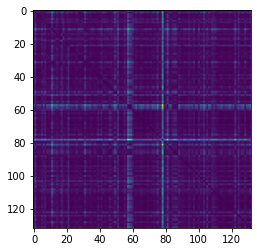

In [17]:
plt.imshow(aff)

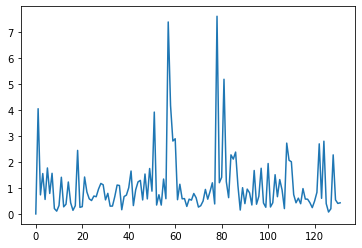

In [20]:
plt.plot(aff[0])

(array([71., 34., 14.,  7.,  0.,  3.,  1.,  0.,  0.,  2.]),
 array([-2.17603713e-14,  7.60145659e-01,  1.52029132e+00,  2.28043698e+00,
         3.04058264e+00,  3.80072829e+00,  4.56087395e+00,  5.32101961e+00,
         6.08116527e+00,  6.84131093e+00,  7.60145659e+00]),
 <BarContainer object of 10 artists>)

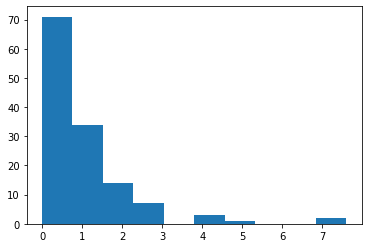

In [21]:
plt.hist(aff[0])

In [165]:
from scipy.stats import median_abs_deviation

mad = median_abs_deviation(aff.reshape(-1))
mad

0.43255515160613156

In [166]:
k = 1.4826
zscores = (aff - np.median(aff))/(k * mad)

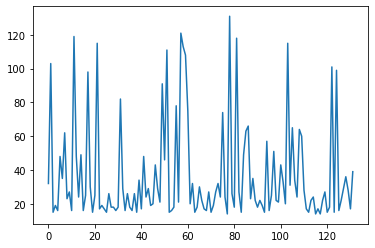

In [167]:
plt.plot(np.sum(zscores >  1, axis=0))

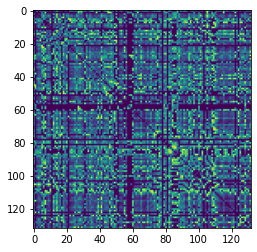

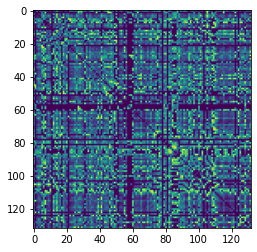

In [171]:
dropped = aff * (zscores < 1)
normed = dropped / dropped.sum()
plt.imshow(dropped)
plt.show()
plt.imshow(normed)

In [182]:
import networkx as nx

G = nx.from_numpy_matrix(normed, create_using=nx.DiGraph)

In [183]:
print(nx.info(G))

Name: 
Type: DiGraph
Number of nodes: 132
Number of edges: 12565
Average in degree:  95.1894
Average out degree:  95.1894


### pagerank

In [184]:
pr = nx.pagerank(G)
res = sorted([(score, idx) for idx, score in pr.items()], reverse=True)
res[:5], res[-5:]

([(0.011022204091392696, 82),
  (0.01069476049471124, 14),
  (0.010486798131009181, 47),
  (0.010192366097166573, 128),
  (0.010161818865649217, 6)],
 [(0.002909911957060762, 58),
  (0.0026879356617567065, 21),
  (0.0026042673661695113, 81),
  (0.002529540427489702, 11),
  (0.0022782085127247367, 57)])

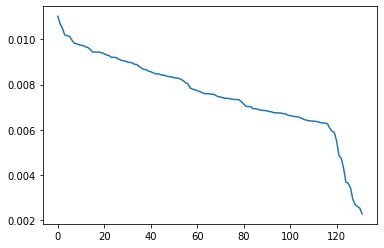

In [188]:
scores, _ = zip(*res)
plt.plot(scores)

In [189]:
for score, idx in res[:10]:
    print(f"score: {score}, idx {idx}")
    row = df.iloc[idx]
    start, end = compute_offset(row.motif, 50, row.cens.shape[1], row.data.shape[0])
    ipd.display(ipd.Audio(row.data[start:end], rate=row.sample_rate))

score: 0.011022204091392696, idx 82


score: 0.01069476049471124, idx 14


score: 0.010486798131009181, idx 47


score: 0.010192366097166573, idx 128


score: 0.010161818865649217, idx 6


score: 0.01013919754538182, idx 80


score: 0.009977239974504223, idx 79


score: 0.009837026601662606, idx 87


score: 0.0098066428845647, idx 95


score: 0.009766195975653827, idx 110


In [177]:
for score, idx in res[-5:]:
    print(f"score: {score}, idx {idx}")
    row = df.iloc[idx]
    start, end = compute_offset(row.motif, 50, row.cens.shape[1], row.data.shape[0])
    ipd.display(ipd.Audio(row.data[start:end], rate=row.sample_rate))

score: 0.002909911957060762, idx 58


score: 0.0026879356617567065, idx 21


score: 0.0026042673661695113, idx 81


score: 0.002529540427489702, idx 11


score: 0.0022782085127247367, idx 57


I'm happy with these results, l

### indegree

In [178]:
deg = np.array([v for _, v in list(G.in_degree)])

(array([ 2.,  7.,  4.,  1.,  4.,  5.,  3.,  9., 27., 70.]),
 array([  1. ,  12.7,  24.4,  36.1,  47.8,  59.5,  71.2,  82.9,  94.6,
        106.3, 118. ]),
 <BarContainer object of 10 artists>)

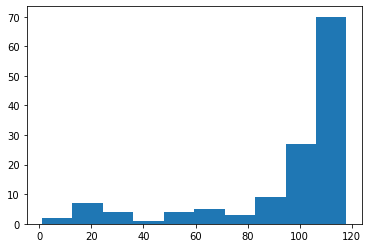

In [179]:
plt.hist(deg)

In [180]:
for score, idx in sorted([(v, i) for i,v in list(G.in_degree)])[:5]:
    print(f"score: {score}")
    row = df.iloc[idx]
    start, end = compute_offset(row.motif, 50, row.cens.shape[1], row.data.shape[0])
    ipd.display(ipd.Audio(row.data[start:end], rate=row.sample_rate))

score: 1


score: 11


score: 13


score: 14


score: 17


In [181]:
for score, idx in sorted([(v, i) for i,v in list(G.in_degree)])[-5:]:
    print(f"score: {score}")
    row = df.iloc[idx]
    start, end = compute_offset(row.motif, 50, row.cens.shape[1], row.data.shape[0])
    ipd.display(ipd.Audio(row.data[start:end], rate=row.sample_rate))

score: 117


score: 117


score: 118


score: 118


score: 118


## computing matrix profiles

Now that we have representative motifs, let's see how much of the training samples we can extract.

In [202]:
pr = nx.pagerank(G)
ranked = sorted([(score, idx) for idx, score in pr.items()])
best = [idx for _, idx in ranked[-5:]]
motifs = df.iloc[best].apply(lambda r: r.cens[:, r.motif:r.motif+50], axis=1)

In [204]:
motifs

6      [[0.2539415595933992, 0.25372893341490993, 0.2...
128    [[0.29118840430860266, 0.2903693368604885, 0.2...
47     [[0.27711325410384646, 0.27703150495222056, 0....
14     [[0.2979688790461649, 0.2908462365756396, 0.28...
82     [[0.2456586935673209, 0.2443326955008714, 0.24...
dtype: object

In [219]:
profiles = []
for full in tqdm(df.cens):
    row_profiles = []
    for motif in motifs:
        mp, _ = simple_fast(full, motif, 25)
        row_profiles.append(mp)
    profiles.append(row_profiles)

  0%|          | 0/132 [00:00<?, ?it/s]

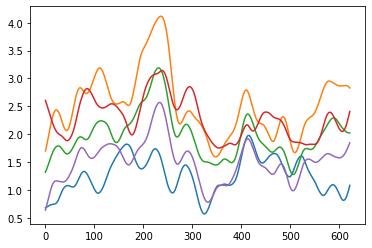

In [222]:
for col in profiles[0]:
    plt.plot(col)

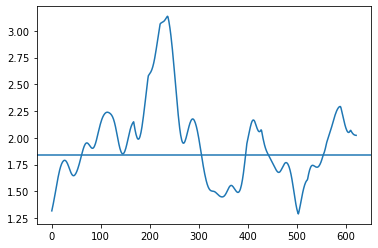

In [243]:
arr = np.array(profiles[0])
plt.plot(np.median(arr, axis=0))
plt.axhline(np.median(arr))

In [238]:
under = np.median(arr, axis=0) < np.median(arr)
under.sum()/arr.shape[0]

52.4

In [239]:
ipd.Audio(df.iloc[0].data, rate=df.iloc[0].sample_rate)

In [302]:
def get_transition_index(v, offset=0):
    idx = np.where(v[:-1] != v[1:])[0] + 1 + offset
    if v[0]:
        idx = np.append([0], idx)
    if v[-1]:
        idx = np.append(idx, [-1])
    res = []
    for i in range(idx.shape[0]//2):
        res.append(([idx[2*i], idx[(2*i)+1]]))
    return res

x = np.array([False, True, False, False, True, False, True, True, True, False])
get_transition_index(x), x[6:9]

([[1, 2], [4, 5], [6, 9]], array([ True,  True,  True]))

In [303]:
res = []
for row in profiles:
    arr = np.array(row)
    averaged = np.median(arr, axis=0)
    med = np.median(arr)
    res.append(dict(
        profile=averaged, 
        median=med, 
        indices=get_transition_index(averaged < med, 12)
    ))

computed_df = pd.DataFrame(res)
computed_df

,profile,median,indices
0,"[1.3181360186099114, 1.339088472388841, 1.3609...",1.836940,"[[0, 73], [318, 408], [455, 566]]"
1,"[3.2875875483005474, 3.3460743230202965, 3.403...",2.738098,"[[47, 86], [128, -1]]"
2,"[1.1323732153119683, 1.1263640467348217, 1.119...",1.128923,"[[13, 38], [125, 151], [196, 208], [241, 354],..."
3,"[1.1198412059023368, 1.1307207550555813, 1.140...",1.150009,"[[0, 15], [29, 85]]"
4,"[0.936504791706323, 0.9395478464569649, 0.9440...",1.239133,"[[0, 86], [140, 177], [198, 269], [307, 334], ..."
...,...,...,...
127,"[1.7280519382454789, 1.6954887388162063, 1.664...",1.506654,"[[20, 34], [95, 137], [145, -1]]"
128,"[3.70228504389965, 3.5233293634033336, 3.36229...",2.189449,"[[40, 80], [118, 177], [212, 313], [463, 562],..."
129,"[1.0545340765073357, 1.0605035890379002, 1.067...",1.322460,"[[0, 68], [138, 151], [167, 177], [191, 254], ..."
130,"[1.2668287417039947, 1.2576881355354832, 1.251...",1.209727,"[[31, 96], [133, 189], [212, 244], [254, 306],..."


0.5389221556886228
[[19, 63], [89, 103], [115, 154], [200, 267], [330, -1]]


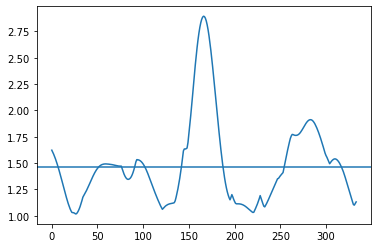

0.42924528301886794
[[0, 93], [151, 161]]


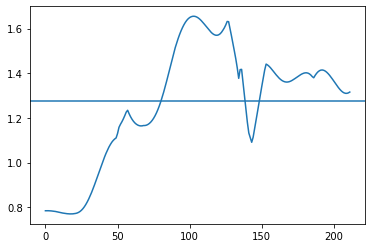

0.48005908419497784
[[14, 46], [166, 200], [337, 353], [390, 507], [539, 606], [630, -1]]


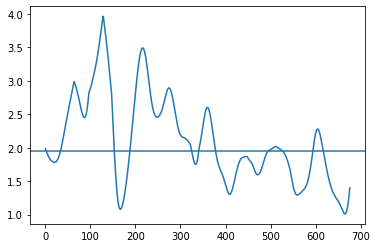

0.5
[[0, 42], [72, 86], [109, 157], [207, 224]]


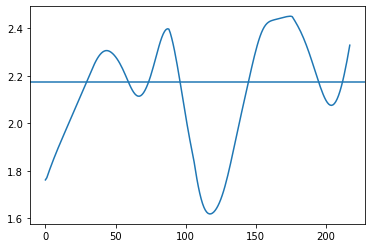

0.5033783783783784
[[65, 72], [158, 300]]


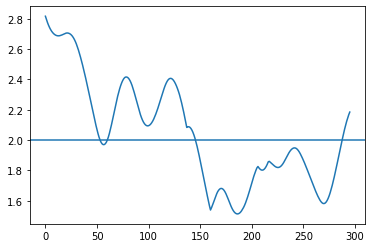

In [304]:
for row in computed_df.sample(5).itertuples():
    plt.plot(row.profile)
    plt.axhline(row.median)
    print(np.sum(row.profile < row.median)/row.profile.shape[0])
    print(row.indices)
    plt.show()

In [308]:
np.ceil(2.3)

3.0

In [330]:
def aligned_slice_indices(n, indices, window):
    # this logic is a bit convoluted, it would be nicer to have an algorithm that's
    # easier to explain
    slices = []
    for start, end in indices:
        if end == -1:
            end = n
        length = end - start
        if length <= window:
            if end < n:
                # get a slice that's centered
                offset = (window - length)//2
                a = start-offset
                b = a + window
                if a < 0:
                    slices.append((0, window))
                else:
                    slices.append((a, b))
            else:
                # get a slice from the end
                slices.append((n-window, n))
            # don't have to worry about the window being shorter than the actual series
        else:
            # we break this into windows that have no more than 2 slices per window
            slide = int(window * 3/4)
            k = int(np.ceil(length / slide))
            total = k * slide 
            offset = (total - length) // 2
            for i in range(k):
                a = start-offset+slide*i
                b = a+window
                if a < 0:
                    slices.append((0, window))
                elif b <= n:
                    slices.append((a, b))
                else:
                    # append this offset from the end, and break
                    slices.append((n-window, n))
                    break

    return slices

aligned_slice_indices(20, [[0, 2], [7, 12], [13, -1]], 4)

[(0, 4), (7, 11), (10, 14), (12, 16), (15, 19), (16, 20)]

In [362]:
def extract_samples(cens, indices, window=50):
    aligned = aligned_slice_indices(cens.shape[1], indices, window)
    return list(zip([cens[:, i:j] for i,j in aligned], aligned))

In [363]:
row = df.join(computed_df).iloc[0]
# extract_samples(row.cens, row.indices)

In [377]:
final = df.join(computed_df)
final["extracted"] = final.apply(lambda x: extract_samples(x.cens, x.indices), axis=1)
exploded = final.explode("extracted")
exploded["sample"] = exploded.extracted.apply(lambda x: x[0])
exploded["index"] = exploded.extracted.apply(lambda x: x[1])
exploded[["name", "parent", "sample", "index"]]

,name,parent,sample,index
0,XC109605,acafly,"[[0.315637348478374, 0.3198084396929352, 0.323...","(0, 50)"
0,XC109605,acafly,"[[0.3190567413819543, 0.3221147397203357, 0.32...","(37, 87)"
0,XC109605,acafly,"[[0.3800211150654463, 0.3806834035555753, 0.38...","(308, 358)"
0,XC109605,acafly,"[[0.2744102772981078, 0.2753075779670232, 0.27...","(345, 395)"
0,XC109605,acafly,"[[0.31720179413237526, 0.3168142043377576, 0.3...","(382, 432)"
...,...,...,...,...
131,XC6671,acafly,"[[0.31661174420648724, 0.3161049572624905, 0.3...","(44, 94)"
131,XC6671,acafly,"[[0.25085459168514307, 0.2488157695692057, 0.2...","(155, 205)"
131,XC6671,acafly,"[[0.2840565284024816, 0.2822228448442749, 0.28...","(192, 242)"
131,XC6671,acafly,"[[0.2691889990981416, 0.2696515715162064, 0.27...","(229, 279)"
